**About the Data**

1. We have total of 20 types of documents(Text files) and total 18828 documents(text files). 

2. Document name is defined as 'ClassLabel_DocumentNumberInThatLabel'. 
so from document name, we can extract the label for that document. 

4. Now our problem is to classify all the documents into any one of the class. 

In [1]:
!wget --header="Host: doc-00-98-docs.googleusercontent.com" --header="User-Agent: Mozilla/5.0 (Windows NT 6.3; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/85.0.4183.83 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9" --header="Accept-Language: en-US,en;q=0.9" --header="Referer: https://drive.google.com/drive/folders/13dXJZqM3nIG8ynV9hs8o49ecXZ0La6jE" --header="Cookie: AUTH_ufqf679c9s84m8v94dndb0c1l42d162e_nonce=84m1o16f4adf6; _ga=GA1.2.675053990.1580593244" --header="Connection: keep-alive" "https://doc-00-98-docs.googleusercontent.com/docs/securesc/cjm3fambk0lkqkbuqmm5ghfps1li7j9b/urf8ufukm6312gbmubtghmbob51th7h0/1599905925000/00484516897554883881/14265967465260034040/1rxD15nyeIPIAZ-J2VYPrDRZI66-TBWvM?e=download&authuser=0&nonce=84m1o16f4adf6&user=14265967465260034040&hash=e0auhnftov68fp9isghdq097jqs3pd81" -c -O 'documents.rar'

--2020-09-12 10:19:36--  https://doc-00-98-docs.googleusercontent.com/docs/securesc/cjm3fambk0lkqkbuqmm5ghfps1li7j9b/urf8ufukm6312gbmubtghmbob51th7h0/1599905925000/00484516897554883881/14265967465260034040/1rxD15nyeIPIAZ-J2VYPrDRZI66-TBWvM?e=download&authuser=0&nonce=84m1o16f4adf6&user=14265967465260034040&hash=e0auhnftov68fp9isghdq097jqs3pd81
Resolving doc-00-98-docs.googleusercontent.com (doc-00-98-docs.googleusercontent.com)... 172.217.203.132, 2607:f8b0:400c:c07::84
Connecting to doc-00-98-docs.googleusercontent.com (doc-00-98-docs.googleusercontent.com)|172.217.203.132|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/rar]
Saving to: ‘documents.rar’

documents.rar           [ <=>                ]  18.16M  --.-KB/s    in 0.1s    

2020-09-12 10:19:36 (146 MB/s) - ‘documents.rar’ saved [19038123]



In [83]:
#importing all the necessary liberaries

import pandas as pd
import os
import pickle
from tensorflow.keras.callbacks import EarlyStopping
from numpy import array
from numpy import asarray
from numpy import zeros
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential,Input,Model
from keras.layers import Dense,MaxPooling1D
from keras.layers import Flatten,Dropout,concatenate
from keras.layers import Embedding
import datetime
import numpy as np
from keras.layers.convolutional import Conv1D
from keras.callbacks import TensorBoard
%load_ext tensorboard
import tensorflow as tf
import tensorflow as tf

from sklearn.metrics import f1_score

In [ ]:
get_ipython().system_raw("unrar x documents.rar")

In [41]:
#Getting all the documents

documents_name=os.listdir('./documents')

data=[]
final_data=[]

for doc in documents_name:
 with open('./documents/'+str(doc),'r',encoding='utf8',errors='replace')as file:
  file_content=file.read()
  data.append(file_content)
final_data.append(data)

print(documents_name[10:13])

['talk.politics.misc_178802.txt', 'rec.sport.hockey_53721.txt', 'talk.religion.misc_83642.txt']


**Taking out the class label-**

In [43]:
#Extracting class label 

class_label=[]
for i in documents_name:
  j=i.split("_")
  class_label.append(j[0])
print(class_label[10:13])

['talk.politics.misc', 'rec.sport.hockey', 'talk.religion.misc']


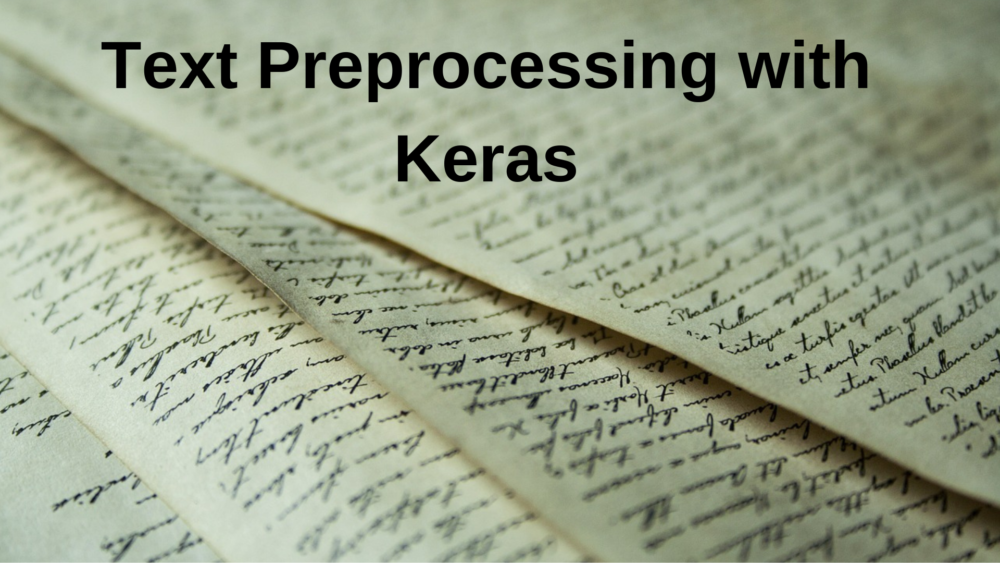

**Taking out the email id-**

In [44]:
#Refrences: https://developers.google.com/edu/python/regular-expressions
#Extracting data after removing EmailId and Email

data_after_email=[]
email_ids=[]
import re
for content in final_data[0]:
  pattern=re.findall(r'[\w\.-]+@[\w\.-]+',content)
  for i in pattern:
    content=content.replace(i," ")
  data_after_email.append(content)
  email_ids.append(pattern)




In [45]:
list3=[]
for item in email_ids:
  list2=[]
  for email in item:
    for i in range(len(email)):
      if(email[i]=='@'):
        x=email[i+1:].split(".")
        list2.append(x)  
  list3.append(list2)




In [46]:
#The final preprocessed emailIds are-
preprecessed_email1=[]
for i in list3:
  list2=[]
  for j in i:
    for k in j:
      if((len(k)>2) & (k!='com')):
        list2.append(k)
  preprecessed_email1.append(list2)
preprocessed_email=[]
for i in preprecessed_email1:
  i1=""
  i1=" ".join(i)
  preprocessed_email.append(i1)
print(preprocessed_email[10])


thor isc-br titan ksc nasa gov ksc nasa gov cellar org cellar org thor ISC-BR COM


**Completely preprocessed emailid-**

In [47]:
print(len(preprocessed_email))

18828


**Taking out the subject-**

In [48]:
#Extracting subject

subject=[]
data_after_subj=[]
for i in data_after_email:
  subj = re.findall("Subject:.*",i)
  for item in subj:
    i=i.replace(str(item)," ")
  data_after_subj.append(i)

  subject.append(subj)
print(subject[10:13])



[['Subject: Re: The earth also pollutes......'], ['Subject: Sweden-Finland, April 15'], ['Subject: Re: OTO, the Ancient Order of Oriental Templars']]


In [49]:
preprocessed_subject=[]

for i in subject:
  
  for item in i:
    item=item.replace("Subject: ",'')
    item=item.replace("Re: ","")
    x = re.sub(r'[^a-zA-Z0-9 ]',r'',item)
   
  preprocessed_subject.append(x)
    
print(preprocessed_subject[10:13])
 

['The earth also pollutes', 'SwedenFinland April 15', 'OTO the Ancient Order of Oriental Templars']


**Completely preprocessed subject-**

In [50]:
preprocessed_subject[15575]

'MAJOR VIEWS OF THE TRINITY'

**Preprocessing text data-**

In [51]:
#preprocessing text data

#Removing Write to: and From: from the data
data_after_from=[]
for i in data_after_subj:
  s=re.findall("Write to:.*",i)
  for s1 in s:
    i=i.replace(str(s1),"")
  s=re.findall("From:.*",i)
  for s1 in s:
    i=i.replace(str(s1),"")
  data_after_from.append(i)

In [52]:
#Removing <anything inside> from the data -  Delete all the tags like "< anyword >" 
data_after_tag=[]
for i in data_after_from:
  s=re.findall('(<.*?>)',i)
  for j in s:
    i=i.replace(str(j),'')

#Removing anything inside ()-Delete all the data which are present in the brackets.
  r=re.findall("\(.*\)",i)
  for r1 in r:
    i=i.replace(str(r1),'')

# Remove all the newlines('\n'), tabs('\t'), "-", "\". 
  tab=re.findall("\t",i)
  for tab1 in tab:
    i=i.replace(str(tab1),'')
  newline=re.findall("\n",i)
  for line in newline:
    i=i.replace(str(line),'')

#Removing all the unnecessary tags in data
  i = re.sub(r'[>|?|\|.|-]',r'',i)
  i = re.sub(r'[=|!|<]',r'',i)
  data_after_tag.append(i)

In [64]:
data_after_tag[4]

' I thought that Walt Weiss was jewish  I seem to recall thiswas mentioned once while he was still at OaklandAlso, I have my suspicions about Esther Canseco Gidi'

In [54]:
#Remove all the words which ends with ":"

data_after_colnWords=[]
for i in data_after_tag:
  for word in i.split():
    if(word[-1]==':'):
      i=i.replace(str(word),'')
  
  data_after_colnWords.append(i)


In [55]:
# Decontractions, replaceing words to their fullforms.

data_after_phrase=[]
for phrase in data_after_colnWords:
    phrase = re.sub(r"won\'t", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    data_after_phrase.append(phrase)

In [67]:
data_after_phrase[1]

' In article     writes:Basically, I am looking for something to operate in theranges of accelerations found in an automobile environmentI would like the device to operate as a trigger for othersystems when the car is deceleration reaches a threshold value(which is how I assume some seat belt lock mechanisms and airbag deployment systems work)Open up one of the airbag control boxes  They have inexpensive piezoelectricaccelerometers in them  I know that the GM cars use the Setra units  Thecheapest way to get such an accelerometer is to cannibalize an existingautomotive unitIncidentally, these things are not very linear, but for the application theywould do a fine jobscott'

In [72]:
#Data after removing all the digits

data_after_digit_removal=[]
for i in data_after_phrase:
  digits=re.findall('[0-9]+',i)
  for digit in digits:
    i=i.replace(digit,"")
  data_after_digit_removal.append(i)


In [98]:
#Data after removing _ before and after words

data_after_underscore=[]
for i in data_after_digit_removal:
  for word in i.split():
    if word.startswith('_'):
      i=i.replace(word[0],"")
    if word.endswith("_"):
      i=i.replace(word[-1],"")
  data_after_underscore.append(i)
#print(data_after_underscore[0:2])

In [74]:
#Data after converting it to lower case

data_after_lowercase=[]
for i in data_after_underscore:
  i_new1 = ' '.join([w for w in i.split() if len(w)>=3])
  i_new=' '.join([w for w in i_new1.split() if (len(w)<16)])
  data_after_lowercase.append(i_new.lower())




In [77]:
#data after replacing all the words except "A-Za-z_" with space

preprocessed_text=[]
for i in data_after_lowercase:
  i=re.sub(r'[^A-Za-z_ ]','',i)
  preprocessed_text.append(i)


In [78]:
len(preprocessed_text)

18828

**Completely preprocessed text-**

In [79]:
preprocessed_text[0]

'article writesexactly when will the hover test done early mid juneand will any the tvnetworks carry really want see thatif they think the public wants see they will carry why notwrite them and ask you can reach them national news mediaabc world news tonight face the nation west street cbs newsnew york street nw washington associated press good morning america rockefeller plaza abc newsnew york desk new york foreign desk washington bureau larry king live tvcbs evening news cnn th street massachusetts avenue nwnew york washington  cbs this morning larry king showradio th street mutual broadcastingnew york jefferson davis highway arlington science monitorcsm publishing society los angeles timesone norway street timesmirror squareboston los angeles cnn macneillehrer newshourone cnn center box box  washington atlanta macneillehrer newshourcnn bureau street massachusetts avenue new york washington nbc newscnn nebraska avenue massachusetts avenue washington washington  morning editionall thi

In [80]:
documents_name.index("alt.atheism_49960.txt")

14387

**Mentioned document for analysis-**

In [81]:

print("The preprocessed subject for given document is :",preprocessed_subject[15575])
print("**************")
print("The preprocessed email for given document is :",preprocessed_email[15575])
print("**************")
print("The preprocessed text for given document is :",preprocessed_text[15575])
print("**************")


The preprocessed subject for given document is : MAJOR VIEWS OF THE TRINITY
**************
The preprocessed email for given document is : athena uga edu athos rutgers edu elsegundoca ncr athena uga edu
**************
The preprocessed text for given document is : article simply put not see any way that platonic essence could have any real existance essence the platonic sense does not have any referent far can tell just imaginary concept invented provide explanation for things better explained other waysyou are quite confident that essences not exist how propose todefine beings can thing can one without definition can beinghave definition and know essencewhat about properties beings have properties does god numbers exist reality abstract entities invent them thus me the unity god must primary and the triality must secondary must modal aspectual relating roles modes interaction since otherwise there meaning saying god onesee post altmessianic about the possibilities tritheism from aphiolo

In [82]:

data=pd.DataFrame({"text":final_data[0],"class":class_label,"precrocessed_text":preprocessed_text,"preprocessed_subj":preprocessed_subject,"preprocessed_email":preprocessed_email})

In [ ]:
pickle.dump(data,open('data.pkl','wb'))

In [ ]:
data=pickle.load(open('data1.pkl','rb'))

In [84]:
def addition(data11,data2,data3):

  return data11+" "+data2+ " "+data3

In [85]:
data['preprocessed_data'] = data.apply(lambda row: addition(row['preprocessed_subj'],row['preprocessed_email'],row['precrocessed_text']),axis=1)

In [86]:
data['preprocessed_data'].loc[1]

'Accelerometer request respecified grissom larc nasa gov walter bellcore ski bellcore article looking for something operate theranges accelerations found automobile environmenti would like the device operate trigger for othersystems when the car deceleration reaches threshold valuewhich how assume some seat belt lock mechanisms and airbag deployment systems workopen one the airbag control boxes they have inexpensive them know that the cars use the setra units thecheapest way get such accelerometer cannibalize these things are not very linear but for the application theywould fine jobscott'

In [87]:
data.head()

,text,class,precrocessed_text,preprocessed_subj,preprocessed_email,preprocessed_data
0,From: aws@iti.org (Allen W. Sherzer)\nSubject:...,sci.space,article writesexactly when will the hover test...,DCX update,iti org angus org angus org,DCX update iti org angus org angus org article...
1,From: kludge@grissom.larc.nasa.gov (Scott Dors...,sci.electronics,article looking for something operate therange...,Accelerometer request respecified,grissom larc nasa gov walter bellcore ski bell...,Accelerometer request respecified grissom larc...
2,From: xx155@yfn.ysu.edu (Family Magazine Sysop...,soc.religion.christian,the join america prayer acknowledge our depend...,NATIONAL DAY Of PRAYER,yfn ysu edu,NATIONAL DAY Of PRAYER yfn ysu edu the join am...
3,From: mjs@sys.uea.ac.uk (Mike Sixsmith)\nSubje...,rec.motorcycles,writeshi janicei not know being unduly cautiou...,Looking for Womens Motorcycle Helmet,sys uea alex,Looking for Womens Motorcycle Helmet sys uea a...
4,From: gidi@Hilbert.Stanford.EDU (Gidi Avrahami...,rec.sport.baseball,thought that walt weiss was jewish seem recall...,Jewish Baseball Players,Hilbert Stanford EDU,Jewish Baseball Players Hilbert Stanford EDU t...


In [88]:
from sklearn.model_selection import train_test_split
y=data['class']
x=data.drop('class',axis=1)


In [89]:
X_train,X_test,y_train,y_test= train_test_split(x,y,random_state=42,stratify=y,test_size=0.25)

In [90]:
from sklearn.preprocessing import LabelEncoder
import numpy as np

label_encoder_12 = LabelEncoder()
vec_12 = label_encoder_12.fit_transform(y_train)


In [93]:
Y_train_label = tf.keras.utils.to_categorical(vec_12, 20)
print(Y_train_label)

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 1. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 1. 0.]]


In [94]:
label_encoder_test = LabelEncoder()
vec_test = label_encoder_test.fit_transform(y_test)
Y_test_label = tf.keras.utils.to_categorical(vec_test, 20)

In [95]:
Y_test_label.shape

(4707, 20)

**Call backs**--

In [ ]:

class F1score(tf.keras.callbacks.Callback):
  def __init__(self,x_test,y_test):
    super(F1score,self).__init__()
    self.x_test=x_test
    self.y_test=y_test
    self.history={'auc': [],'F1_score':[]}

  def on_epoch_end(self, epoch, logs={}):
    f1=0
    y_pred=self.model.predict(self.x_test)
    metrix1=[]
    for val in y_pred:
      y_val=np.argmax(val)
      arr=np.zeros(20,dtype=int)
      arr[y_val]=1
      metrix1.append(arr)
    f1=f1_score(self.y_test,np.array(metrix1),average='micro')
    print("The F1 score for this epoch is: ",f1)
    

In [ ]:
np.random.seed(7)
t = Tokenizer(filters='!"#$%&()*+,-/:;<=>?@[\\]^`{|}~\t\n')
t.fit_on_texts(X_train['preprocessed_data'])
vocab_size = len(t.word_index) + 1

# integer encode the documents
encoded_docs_train= t.texts_to_sequences(X_train['preprocessed_data'])
encoded_docs_test= t.texts_to_sequences(X_test['preprocessed_data'])

# pad documents to a max length of 8550 words
max_length = (1050)
padded_docs_train = pad_sequences(encoded_docs_train, maxlen=max_length, padding='post')
padded_docs_test = pad_sequences(encoded_docs_test, maxlen=max_length, padding='post')

log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)

In [ ]:
max_length_for_padding=[] 
for i in encoded_docs_train:  
  max_length_for_padding.append(len(i))  
print(max(max_length_for_padding))

8544


**The actual padding needed here is of 8544 but the training time for this much value is very high per epoch.**

**So the actual valve I have taken for padding is 1050.**

In [ ]:
# load the whole embedding into memory
embeddings_index = dict()
f = open('/content/glove.6B.100d.txt')
for line in f:
	values = line.split()
	word = values[0]
	coefs = np.asarray(values[1:], dtype='float32')
	embeddings_index[word] = coefs
f.close()
print('Loaded %s word vectors.' % len(embeddings_index))

In [ ]:
# create a weight matrix for words in training docs
embedding_matrix = zeros((vocab_size, 100))
for word, i in t.word_index.items():
	embedding_vector = embeddings_index.get(word)
	if embedding_vector is not None:
		embedding_matrix[i] = embedding_vector

In [ ]:

# define model
input =  Input(shape=(max_length,),dtype='int32')
e = Embedding(vocab_size, 100, weights=[embedding_matrix], input_length=1050, trainable=True)(input)

x1=Conv1D(3,7,kernel_initializer='glorot_uniform',activation='relu')(e)
x2=Conv1D(3,8,kernel_initializer='glorot_uniform',activation='relu')(e)
x3=Conv1D(3,6,kernel_initializer='glorot_uniform',activation='relu')(e)

concatted1= concatenate([x1,x2,x3],axis=1)

max_pool1=MaxPooling1D(3)(concatted1)

y1=Conv1D(3,9,kernel_initializer='glorot_uniform',activation='relu')(max_pool1)
y2=Conv1D(3,4,kernel_initializer='glorot_uniform',activation='relu')(max_pool1)
y3=Conv1D(3,5,kernel_initializer='glorot_uniform',activation='relu')(max_pool1)

concatted2 =concatenate([y1,y2,y3],axis=1)
max_pool2=MaxPooling1D(3)(concatted2)
drop_out=Dropout(0.5)(max_pool2)
max_pool3=MaxPooling1D(3)(drop_out)

conv_layer1=Conv1D(3,12, activation='relu')(max_pool3)

flatten=Flatten()(conv_layer1)
drop_out2=Dropout(0.5)(flatten)
dense_layer1=Dense(100, activation='relu')(drop_out2)
output_layer=Dense(20, activation='softmax')(dense_layer1)

optimizer1 = tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9)
earlystop = EarlyStopping(monitor='accuracy', min_delta=0.00, patience=2, verbose=1)
score=F1score(x_test=padded_docs_test,y_test=Y_test_label)

model = Model(inputs=input,outputs=output_layer)
# compile the model
callback_list = [tensorboard_callback,earlystop,score]

history=model.compile(optimizer=optimizer1, loss='categorical_crossentropy', metrics=['accuracy'])
# summarize the model
print(model.summary())



(4707, 1050)
(4707, 20)
Model: "model_33"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_37 (InputLayer)           (None, 1050)         0                                            
__________________________________________________________________________________________________
embedding_37 (Embedding)        (None, 1050, 100)    17672000    input_37[0][0]                   
__________________________________________________________________________________________________
conv1d_240 (Conv1D)             (None, 1044, 3)      2103        embedding_37[0][0]               
__________________________________________________________________________________________________
conv1d_241 (Conv1D)             (None, 1043, 3)      2403        embedding_37[0][0]               
___________________________________________________________________

In [ ]:
# fit the model
model.fit(padded_docs_train, Y_train_label, epochs=20, verbose=1,callbacks=callback_list)
# evaluate the model
loss, accuracy = model.evaluate(padded_docs_train, Y_train_label, verbose=1)
print('Accuracy: %f' % (accuracy*100))

Epoch 1/20
14121/14121 [==============================] - 175s 12ms/step - loss: 2.8253 - accuracy: 0.0905
The F1 score for this epoch is:  0.14977692797960485
Epoch 2/20
14121/14121 [==============================] - 178s 13ms/step - loss: 2.2718 - accuracy: 0.2020
The F1 score for this epoch is:  0.29318036966220523
Epoch 3/20
14121/14121 [==============================] - 174s 12ms/step - loss: 1.9312 - accuracy: 0.2906
The F1 score for this epoch is:  0.35797748034841725
Epoch 4/20
14121/14121 [==============================] - 174s 12ms/step - loss: 1.7168 - accuracy: 0.3760
The F1 score for this epoch is:  0.4363713618015721
Epoch 5/20
14121/14121 [==============================] - 175s 12ms/step - loss: 1.5429 - accuracy: 0.4444
The F1 score for this epoch is:  0.485234756745273
Epoch 6/20
14121/14121 [==============================] - 175s 12ms/step - loss: 1.4473 - accuracy: 0.4834
The F1 score for this epoch is:  0.5536435096664543
Epoch 7/20
14121/14121 [====================

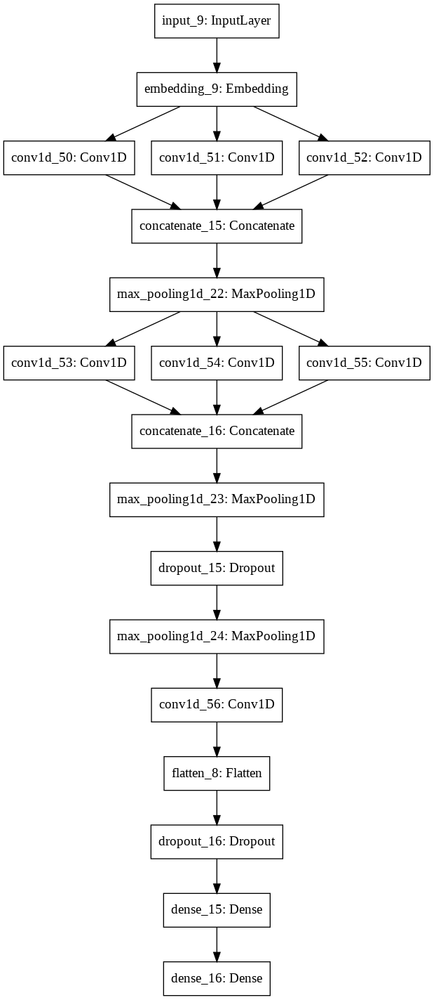

In [ ]:
tf.keras.utils.plot_model(model,to_file='model.png',show_shapes=False,show_layer_names=True,rankdir='TB',expand_nested=False,dpi=96)

In [ ]:
#tensorborard result

%tensorboard --logdir logs/fit

<IPython.core.display.Javascript object>

**Conclusion-**


1) Model one used word encodding to classify text data and for that we have used pre existing glove vectors.

2) For model 1 the padding needed was of 8544 but this was taking a lot of time to run the complete model and taking padding vaue of 1050 also gave us fairly good accuracy, which was around 76%.

3) AS with the graphs it is clear that for this model the accuracy is increasing per epoch and loss is decreasing.

4) We could have increased our accuracy with more padding and by improving the structure of our model.
